In [1]:
using OrdinaryDiffEq, StaticArrays, CairoMakie, DynamicalSystems, Random

**Problem 4.5.3**

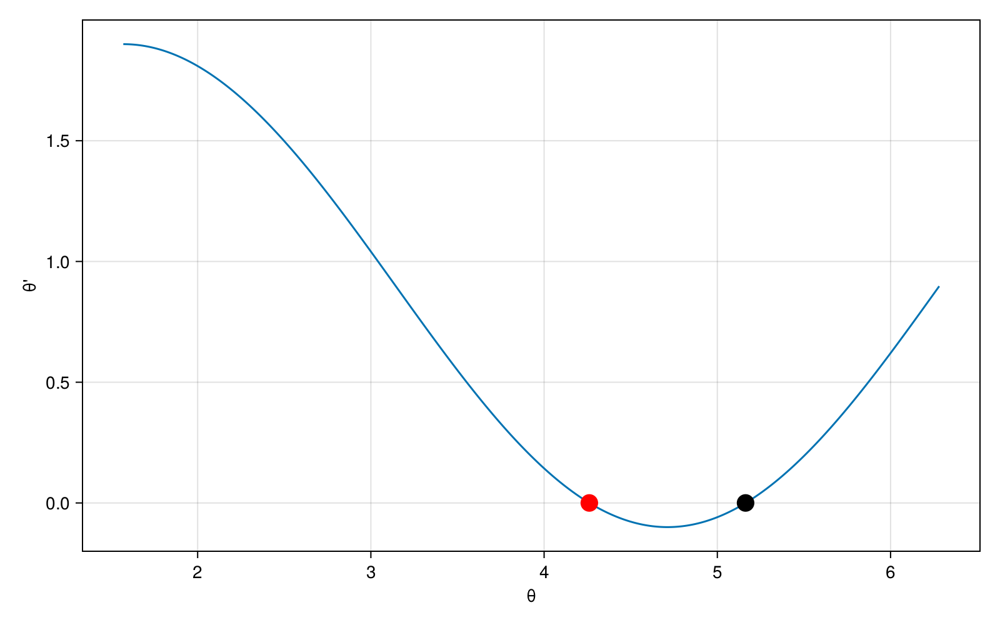

In [59]:
θ = π/2:0.01:2π
μ = 0.9
f = μ .+ sin.(θ)
fig = Figure(size=(800,500))
ax = Axis(fig[1,1])
lines!(ax, θ, f)
scatter!(ax, [4.261], [0], markersize=20, color=:red)
scatter!(ax, [5.163], [0], markersize=20, color=:black)
ax.xlabel = "θ"
ax.ylabel = "θ'"
fig

In [2]:
function Θ(u, p, t)
    θ = u[1]
    μ = p[1]
    Θ = μ + sin(θ)
    return SVector(Θ)
end

Θ (generic function with 1 method)

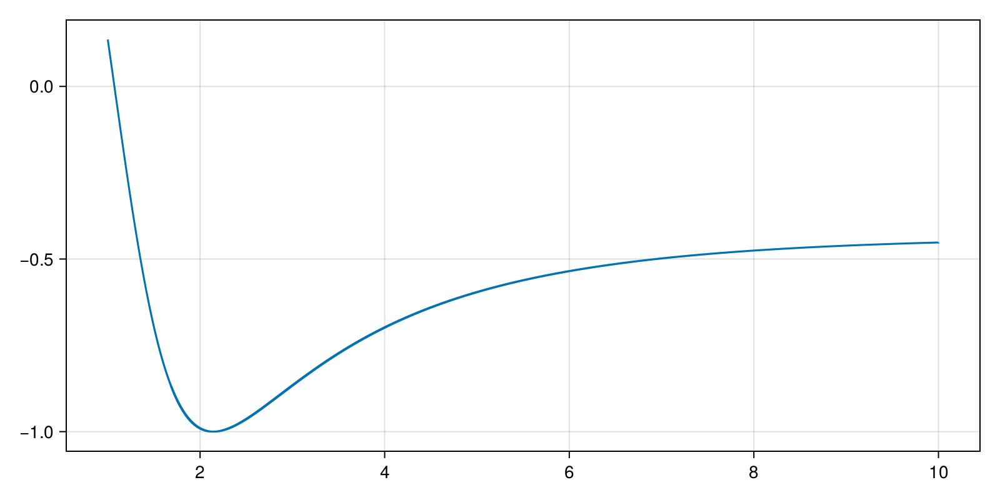

In [7]:
p = [0.9]
u₀ = SVector(0)
tspan = (0.0,10.0)
prob = ODEProblem(Θ,u₀,tspan,p)
sol = solve(prob,alg=Vern9())

θ = sol[1,:]
t = sol.t

t = 1:0.00001:10
Points = zeros(length(t))
for (i,τ) ∈ enumerate(t)
    Points[i] = cos.(sol(τ)[1])
end

fig = Figure(size=(800,400))
ax = Axis(fig[1,1])
lines!(ax,t, Points)
fig

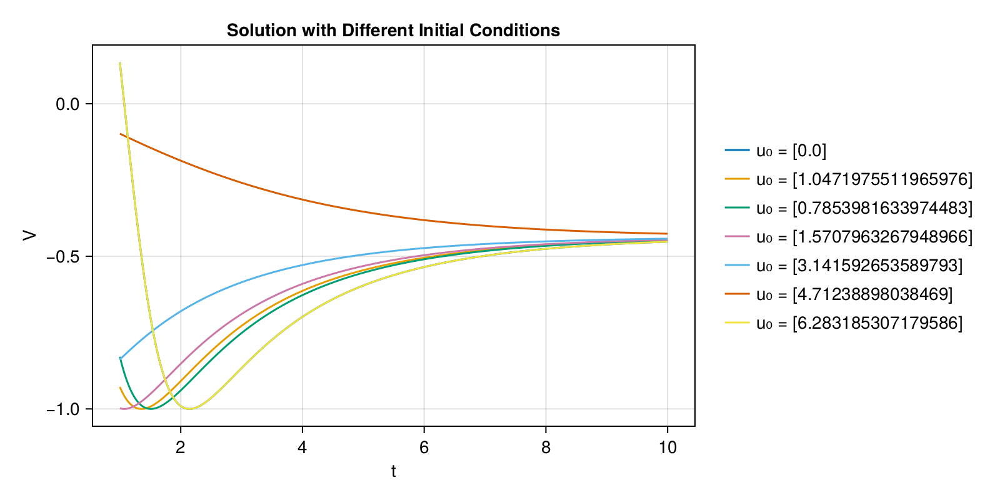

In [25]:
initial_conditions = [SVector(0), SVector(π/3), SVector(π/4), SVector(π/2), SVector(π), SVector(3π/2), SVector(2π)]
fig = Figure(size=(800,400))
t = 1:0.01:10
ax = Axis(fig[1,1])
for u₀ in initial_conditions
    prob = ODEProblem(Θ, u₀, tspan, p)
    sol = solve(prob, alg=Vern9())
    Points = [cos(sol(t[i])[1]) for i in 1:length(t)]
    lines!(ax, t, Points, label="u₀ = $u₀")
end
ax.xlabel = "t"
ax.ylabel = "V"
ax.title = "Solution with Different Initial Conditions"
Legend(fig[1,2], ax, framevisible = false)
fig

**Problem 5.1.10**

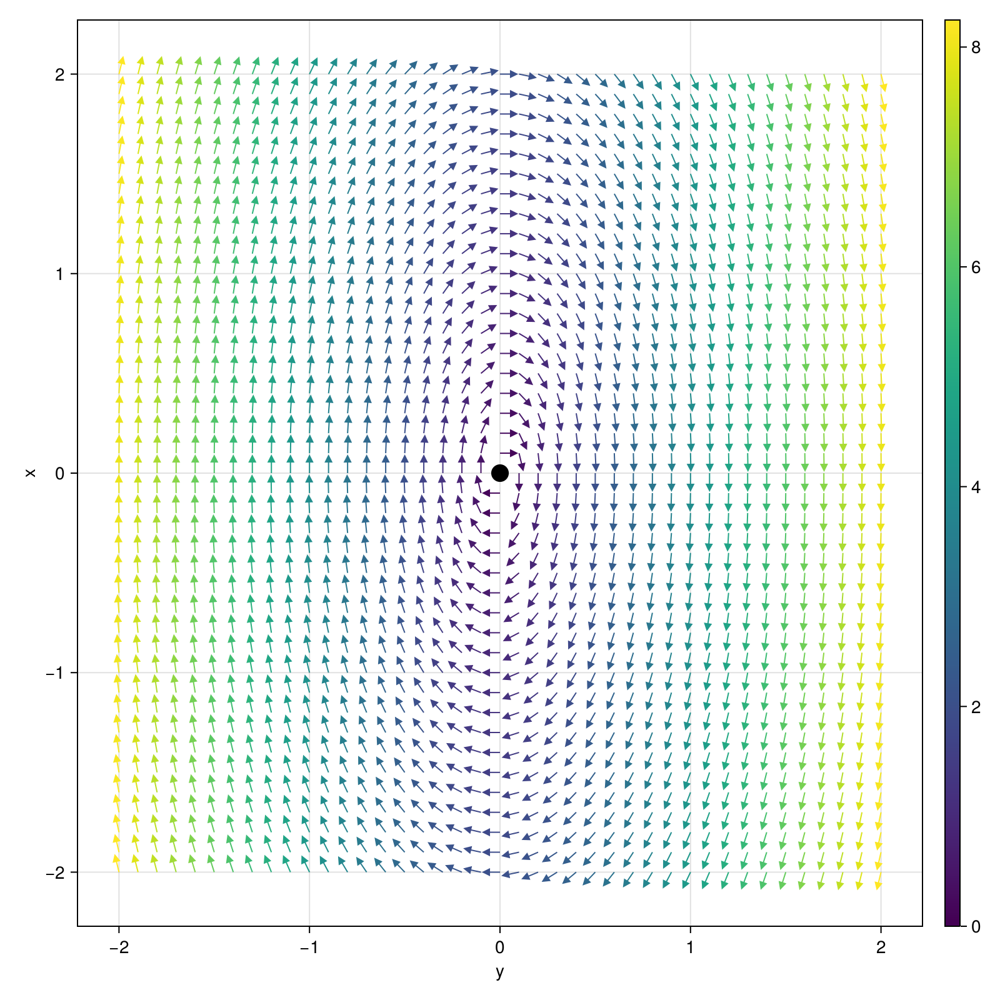

In [101]:
xs = -2:0.1:2
ys = -2:0.1:2

x = zeros((length(xs), length(ys)))
y = zeros((length(ys), length(xs)))
ẋ = zeros((length(xs), length(ys)))
ẏ = zeros((length(ys), length(xs)))

for (i, _x) ∈ enumerate(xs), (j, _y) ∈ enumerate(ys)
    x[i,j] = _x
    y[i,j] = _y
    ẋ[i,j] = _y
    ẏ[i,j] = -4*_x
end

size_vec = length(xs)*length(ys)
x = reshape(x, size_vec)
y = reshape(y, size_vec)
ẋ = reshape(ẋ, size_vec)
ẏ = reshape(ẏ, size_vec)

mag = sqrt.(ẋ.^2 + ẏ.^2)
ẋ = ẋ ./ mag ./ 15
ẏ = ẏ ./ mag ./ 15

fig = Figure(size = (800,800))
ax = Axis(fig[1,1])
scatter!([0], [0], color=:black, markersize=20)
arrows!(ax, x, y, ẋ, ẏ, color = mag, colormap =:viridis)
Colorbar(fig[1,2], limits = (minimum(mag), maximum(mag)))
ax.xlabel = "y"
ax.ylabel = "x"
save("5110a.png", fig)
fig

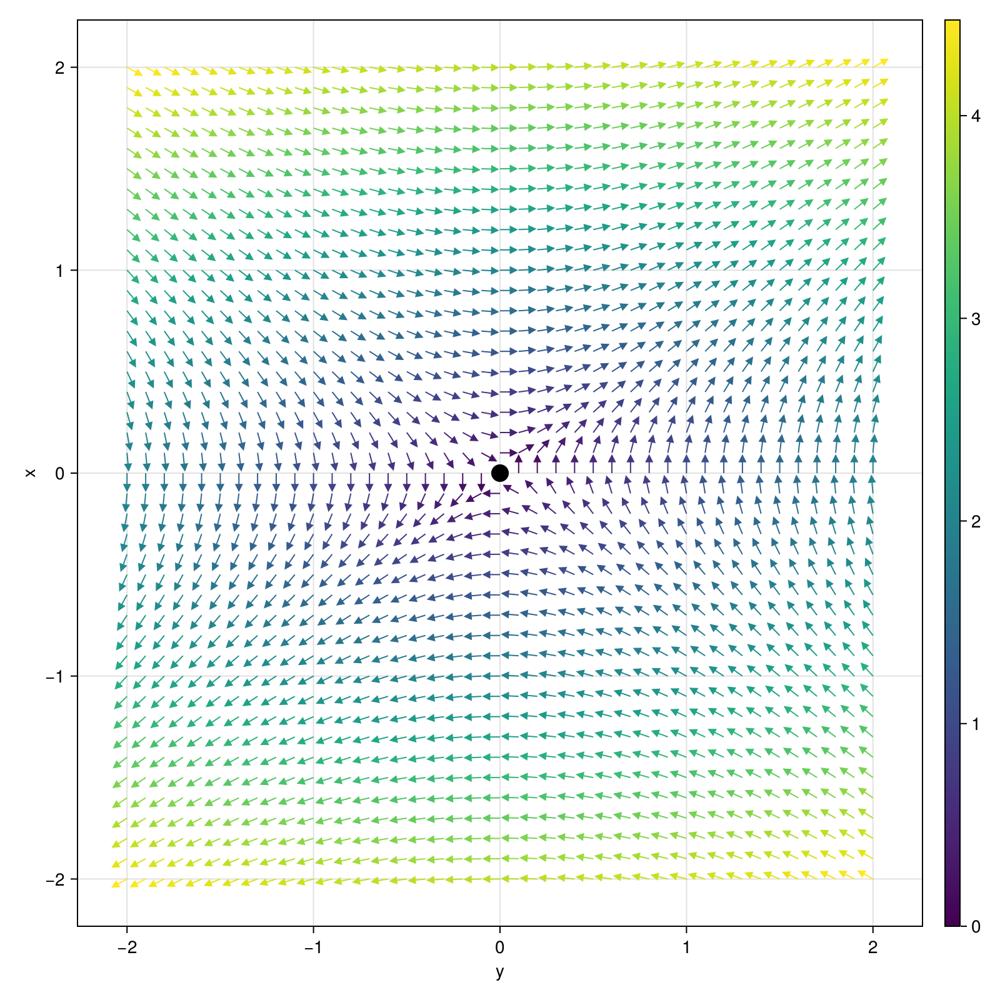

In [102]:
xs = -2:0.1:2
ys = -2:0.1:2

x = zeros((length(xs), length(ys)))
y = zeros((length(ys), length(xs)))
ẋ = zeros((length(xs), length(ys)))
ẏ = zeros((length(ys), length(xs)))

for (i, _x) ∈ enumerate(xs), (j, _y) ∈ enumerate(ys)
    x[i,j] = _x
    y[i,j] = _y
    ẋ[i,j] = 2_y
    ẏ[i,j] = _x
end

size_vec = length(xs)*length(ys)
x = reshape(x, size_vec)
y = reshape(y, size_vec)
ẋ = reshape(ẋ, size_vec)
ẏ = reshape(ẏ, size_vec)

mag = sqrt.(ẋ.^2 + ẏ.^2)
ẋ = ẋ ./ mag ./ 15
ẏ = ẏ ./ mag ./ 15


fig = Figure(size = (800,800))
ax = Axis(fig[1,1])
scatter!([0], [0], color=:black, markersize=20)
arrows!(ax, x, y, ẋ, ẏ, color = mag, colormap =:viridis)
Colorbar(fig[1,2], limits = (minimum(mag), maximum(mag)))
ax.xlabel = "y"
ax.ylabel = "x"
save("5110b.png", fig)
fig

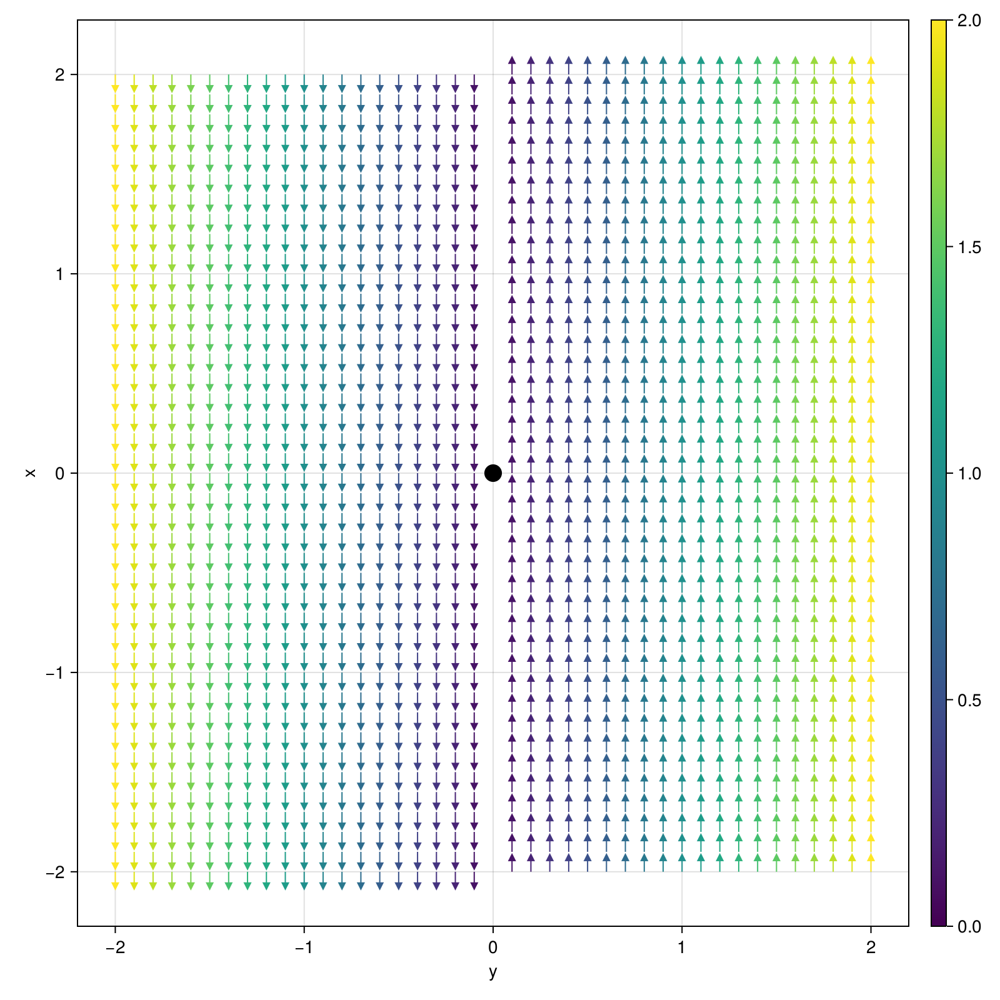

In [103]:
xs = -2:0.1:2
ys = -2:0.1:2

x = zeros((length(xs), length(ys)))
y = zeros((length(ys), length(xs)))
ẋ = zeros((length(xs), length(ys)))
ẏ = zeros((length(ys), length(xs)))

for (i, _x) ∈ enumerate(xs), (j, _y) ∈ enumerate(ys)
    x[i,j] = _x
    y[i,j] = _y
    ẋ[i,j] = 0
    ẏ[i,j] = _x
end

size_vec = length(xs)*length(ys)
x = reshape(x, size_vec)
y = reshape(y, size_vec)
ẋ = reshape(ẋ, size_vec)
ẏ = reshape(ẏ, size_vec)

mag = sqrt.(ẋ.^2 + ẏ.^2)
ẋ = ẋ ./ mag ./ 15
ẏ = ẏ ./ mag ./ 15


fig = Figure(size = (800,800))
ax = Axis(fig[1,1])
scatter!([0], [0], color=:black, markersize=20)
arrows!(ax, x, y, ẋ, ẏ, color = mag, colormap =:viridis)
Colorbar(fig[1,2], limits = (minimum(mag), maximum(mag)))
ax.xlabel = "y"
ax.ylabel = "x"
save("5110c.png", fig)
fig

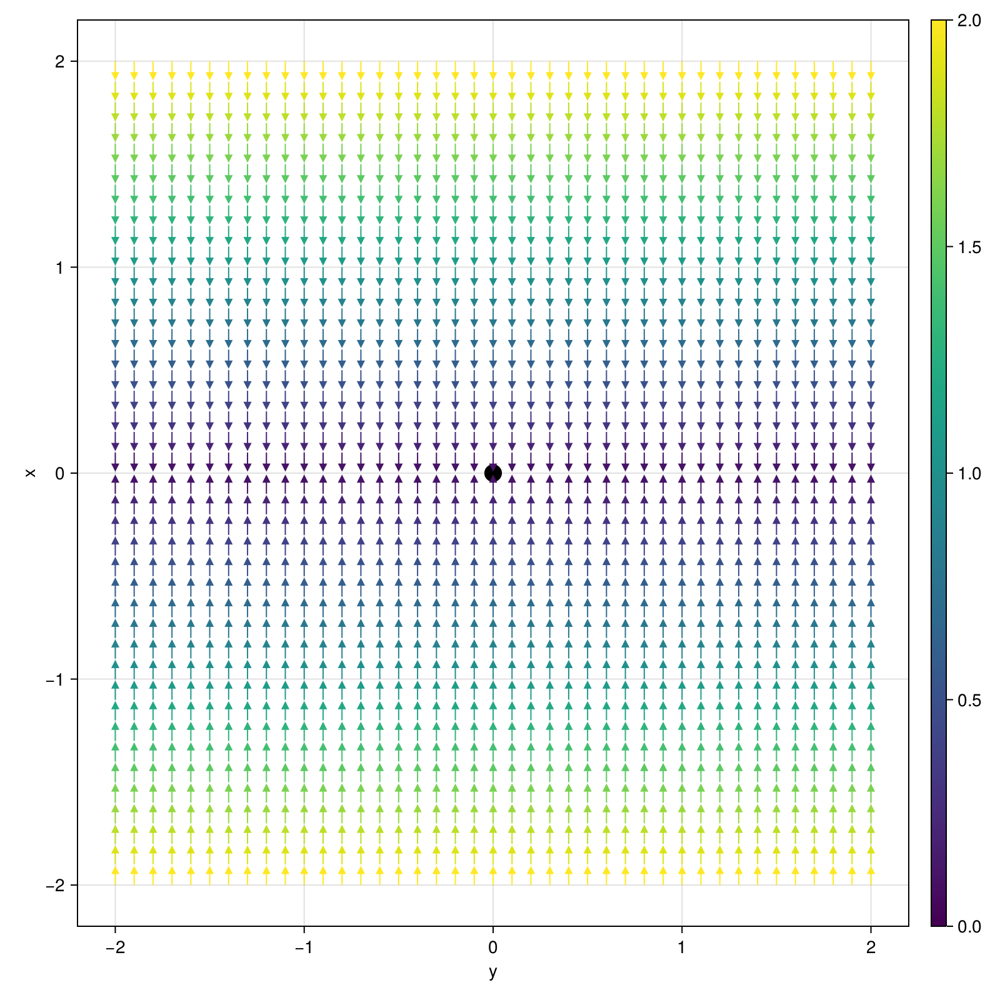

In [104]:
xs = -2:0.1:2
ys = -2:0.1:2

x = zeros((length(xs), length(ys)))
y = zeros((length(ys), length(xs)))
ẋ = zeros((length(xs), length(ys)))
ẏ = zeros((length(ys), length(xs)))

for (i, _x) ∈ enumerate(xs), (j, _y) ∈ enumerate(ys)
    x[i,j] = _x
    y[i,j] = _y
    ẋ[i,j] = 0
    ẏ[i,j] = - _y
end

size_vec = length(xs)*length(ys)
x = reshape(x, size_vec)
y = reshape(y, size_vec)
ẋ = reshape(ẋ, size_vec)
ẏ = reshape(ẏ, size_vec)

mag = sqrt.(ẋ.^2 + ẏ.^2)
ẋ = ẋ ./ mag ./ 15
ẏ = ẏ ./ mag ./ 15


fig = Figure(size = (800,800))
ax = Axis(fig[1,1])
scatter!([0], [0], color=:black, markersize=20)
arrows!(ax, x, y, ẋ, ẏ, color = mag, colormap =:viridis)
Colorbar(fig[1,2], limits = (minimum(mag), maximum(mag)))
ax.xlabel = "y"
ax.ylabel = "x"
save("5110d.png", fig)
fig

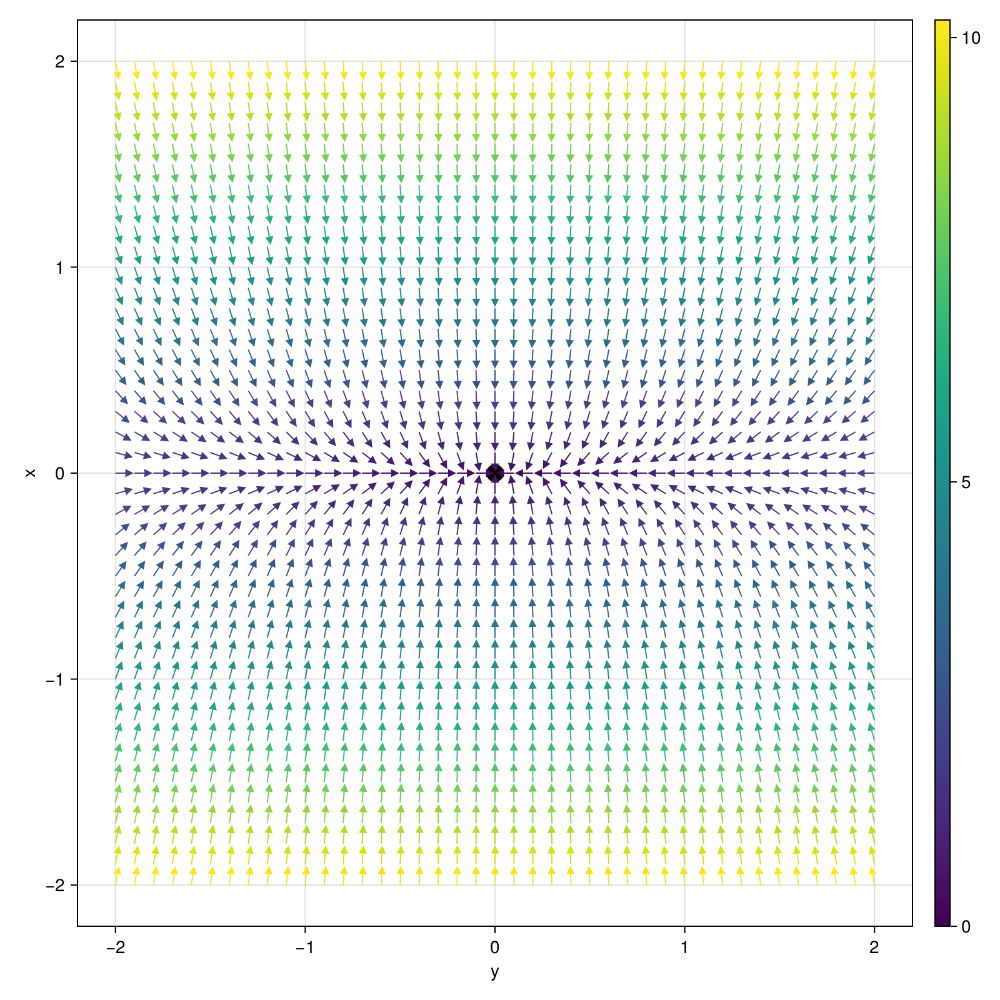

In [105]:
xs = -2:0.1:2
ys = -2:0.1:2

x = zeros((length(xs), length(ys)))
y = zeros((length(ys), length(xs)))
ẋ = zeros((length(xs), length(ys)))
ẏ = zeros((length(ys), length(xs)))

for (i, _x) ∈ enumerate(xs), (j, _y) ∈ enumerate(ys)
    x[i,j] = _x
    y[i,j] = _y
    ẋ[i,j] = - _x
    ẏ[i,j] = -5 * _y
end

size_vec = length(xs)*length(ys)
x = reshape(x, size_vec)
y = reshape(y, size_vec)
ẋ = reshape(ẋ, size_vec)
ẏ = reshape(ẏ, size_vec)

mag = sqrt.(ẋ.^2 + ẏ.^2)
ẋ = ẋ ./ mag ./ 15
ẏ = ẏ ./ mag ./ 15


fig = Figure(size = (800,800))
ax = Axis(fig[1,1])
scatter!([0], [0], color=:black, markersize=20)
arrows!(ax, x, y, ẋ, ẏ, color = mag, colormap =:viridis)
Colorbar(fig[1,2], limits = (minimum(mag), maximum(mag)))
ax.xlabel = "y"
ax.ylabel = "x"
save("5110e.png", fig)
fig

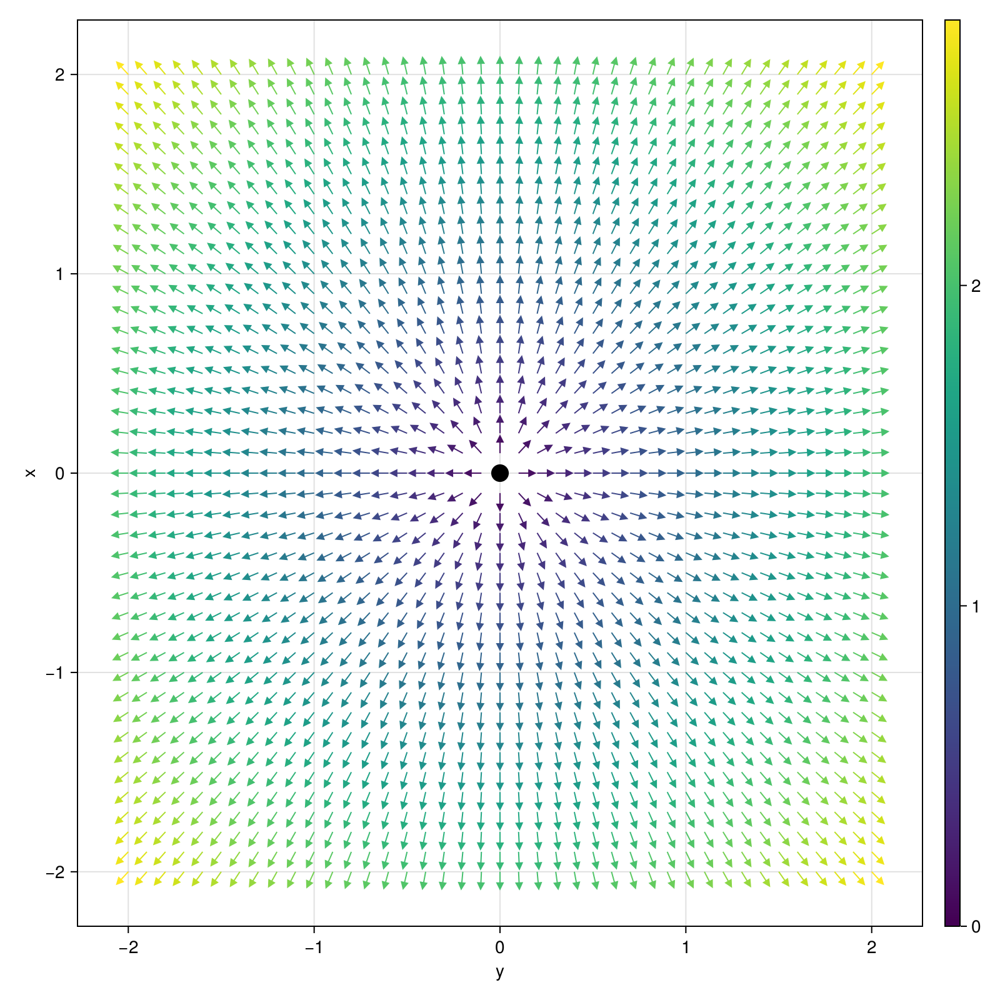

In [106]:
xs = -2:0.1:2
ys = -2:0.1:2

x = zeros((length(xs), length(ys)))
y = zeros((length(ys), length(xs)))
ẋ = zeros((length(xs), length(ys)))
ẏ = zeros((length(ys), length(xs)))

for (i, _x) ∈ enumerate(xs), (j, _y) ∈ enumerate(ys)
    x[i,j] = _x
    y[i,j] = _y
    ẋ[i,j] = _x
    ẏ[i,j] = _y
end

size_vec = length(xs)*length(ys)
x = reshape(x, size_vec)
y = reshape(y, size_vec)
ẋ = reshape(ẋ, size_vec)
ẏ = reshape(ẏ, size_vec)

mag = sqrt.(ẋ.^2 + ẏ.^2)
ẋ = ẋ ./ mag ./ 15
ẏ = ẏ ./ mag ./ 15


fig = Figure(size = (800,800))
ax = Axis(fig[1,1])
scatter!([0], [0], color=:black, markersize=20)
arrows!(ax, x, y, ẋ, ẏ, color = mag, colormap =:viridis)
Colorbar(fig[1,2], limits = (minimum(mag), maximum(mag)))
ax.xlabel = "x"
ax.ylabel = "y"
save("5110f.png", fig)
fig

**Problem 5.2.14**

In [2]:
center = 0
saddle = 0
unstable_node = 0
unstable_spiral = 0
stable_spiral = 0
stable_node = 0
total = 0
N = 1000000000
for i in 1:N
    total += 1
    a = 2 * rand() - 1
    b = 2 * rand() - 1
    c = 2 * rand() - 1
    d = 2 * rand() - 1
    τ = a + b
    Δ = (a * d) + (b * c)
    if Δ > 0 && τ == 0
        center += 1
    elseif Δ < 0
        saddle += 1
    elseif Δ > 0 && 2 * sqrt(Δ) < τ
        unstable_node += 1
    elseif Δ > 0 && 0<τ && τ<2*sqrt(Δ)
        unstable_spiral += 1
    elseif Δ > 0 && -2 * sqrt(Δ) < τ && τ < 0
        stable_spiral += 1 
    else 
        stable_node += 1
    end
end
prob_center = center/total
prob_sad = saddle/total
prob_unsno = unstable_node/total
prob_unssp = unstable_spiral/total
prob_stasp = stable_spiral/total
prob_stano = stable_node/total

println("Probability of Centers = ", prob_center)
println("Probability of Saddle Points = ", prob_sad)
println("Probability of Unstable Nodes = ", prob_unsno)
println("Probability of Unstable Spirals = ", prob_unssp)
println("Probability of Stable Spirals = ", prob_stasp)
println("Probability of Stable Nodes = ", prob_stano)

Probability of Centers = 0.0
Probability of Saddle Points = 0.499986795
Probability of Unstable Nodes = 0.052862187
Probability of Unstable Spirals = 0.197118394
Probability of Stable Spirals = 0.197166794
Probability of Stable Nodes = 0.05286583


In [3]:
center = 0
saddle = 0
unstable_node = 0
unstable_spiral = 0
stable_spiral = 0
stable_node = 0
total = 0
N = 1000000000
for i in 1:N
    total += 1
    a = randn()
    b = randn() 
    c = randn() 
    d = randn()
    τ = a + b
    Δ = (a * d) + (b * c)
    if Δ > 0 && τ == 0
        center += 1
    elseif Δ < 0
        saddle += 1
    elseif Δ > 0 && 2 * sqrt(Δ) < τ
        unstable_node += 1
    elseif Δ > 0 && 0<τ && τ<2*sqrt(Δ)
        unstable_spiral += 1
    elseif Δ > 0 && -2 * sqrt(Δ) < τ && τ < 0
        stable_spiral += 1 
    else 
        stable_node += 1
    end
end
prob_center = center/total
prob_sad = saddle/total
prob_unsno = unstable_node/total
prob_unssp = unstable_spiral/total
prob_stasp = stable_spiral/total
prob_stano = stable_node/total

println("Probability of Centers = ", prob_center)
println("Probability of Saddle Points = ", prob_sad)
println("Probability of Unstable Nodes = ", prob_unsno)
println("Probability of Unstable Spirals = ", prob_unssp)
println("Probability of Stable Spirals = ", prob_stasp)
println("Probability of Stable Nodes = ", prob_stano)

Probability of Centers = 0.0
Probability of Saddle Points = 0.500004701
Probability of Unstable Nodes = 0.058231846
Probability of Unstable Spirals = 0.19176515
Probability of Stable Spirals = 0.191765732
Probability of Stable Nodes = 0.058232571


**Problem 6.5.6**

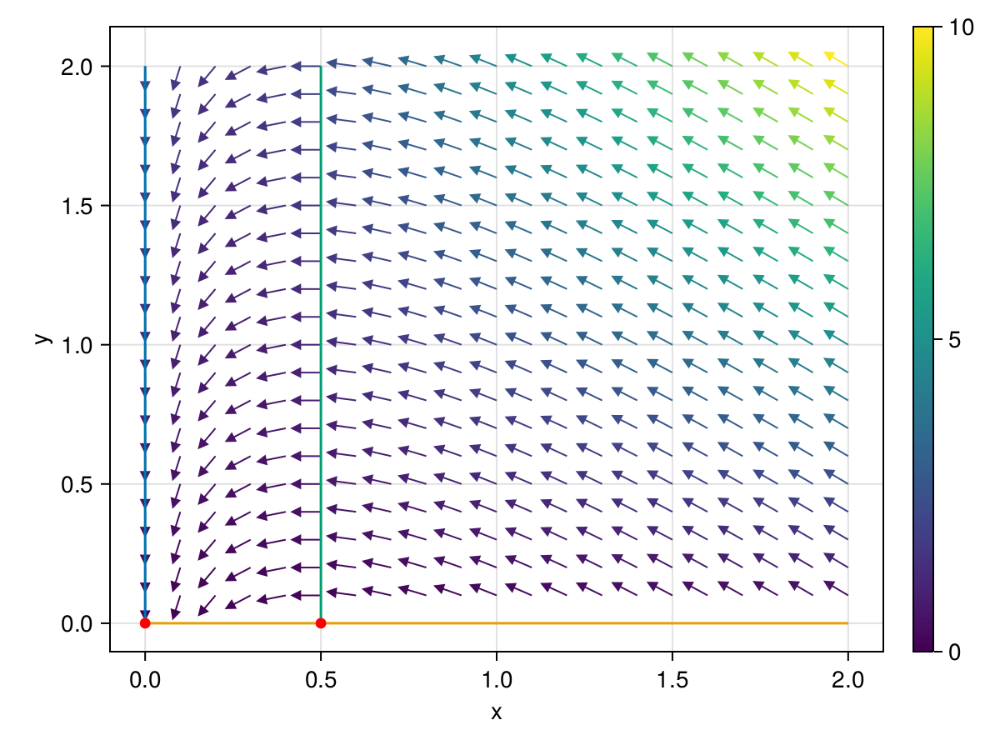

In [13]:
xs = 0:0.1:2
ys = 0:0.1:2
k = 2
l = 1

x = zeros((length(xs), length(ys)))
y = zeros((length(ys), length(xs)))
ẋ = zeros((length(xs), length(ys)))
ẏ = zeros((length(ys), length(xs)))

for (i, _x) ∈ enumerate(xs), (j, _y) ∈ enumerate(ys)
    x[i,j] = _x
    y[i,j] = _y
    ẋ[i,j] = -k*_x*_y
    ẏ[i,j] = k*_x*_y - l * _y
end

size_vec = length(xs)*length(ys)
x = reshape(x, size_vec)
y = reshape(y, size_vec)
ẋ = reshape(ẋ, size_vec)
ẏ = reshape(ẏ, size_vec)

mag = sqrt.(ẋ.^2 + ẏ.^2)
ẋ = ẋ ./ mag ./ 15
ẏ = ẏ ./ mag ./ 15

x1 = zeros(length(ys))
y1 = zeros(length(xs))
x2 = (l/k) .* ones(length(ys))

fig = Figure()
ax = Axis(fig[1,1])
points = [(0, 0), (l/k, 0)]
arrows!(ax, x, y, ẋ, ẏ, color = mag, colormap =:viridis)
Colorbar(fig[1,2], limits = (minimum(mag), maximum(mag)))
lines!(ax, x1, ys)
lines!(ax, xs, y1)
lines!(ax, x2, ys)
scatter!(points, color = "red")
ax.xlabel = "x"
ax.ylabel = "y"
save("656b.png", fig)
fig

**Problem 7.5.7**

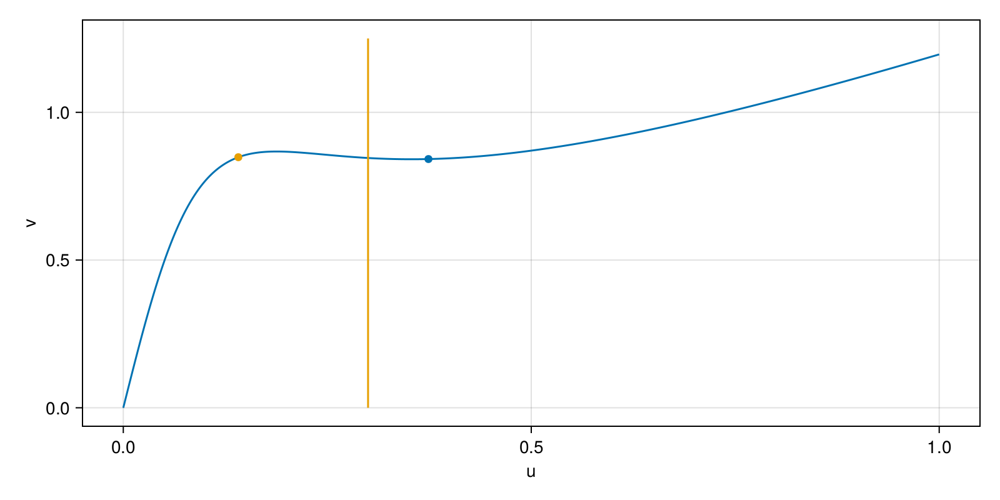

In [38]:
u = 0:0.001:1
v = 0:0.001:1.25
a = 0.02
b = 5
c = 0.3 

v1 = u .* (1 ./ (b .* (a .+ u .^ 2)) .+ 1) 
u1 = fill(c, length(v))

fig = Figure(size=(800, 400))
ax = Axis(fig[1, 1])
lines!(ax, Float32.(u), Float32.(v1))
lines!(ax, Float32.(u1), Float32.(v))
scatter!(ax, [0.374], [0.374 * (1 / (b * (a .+ (0.374)^ 2)) + 1)])
scatter!(ax, [0.141], [0.141 * (1 / (b * (a .+ (0.141)^ 2)) + 1)])
ax.xlabel = "u"
ax.ylabel = "v"
save("757b.png", fig)
fig

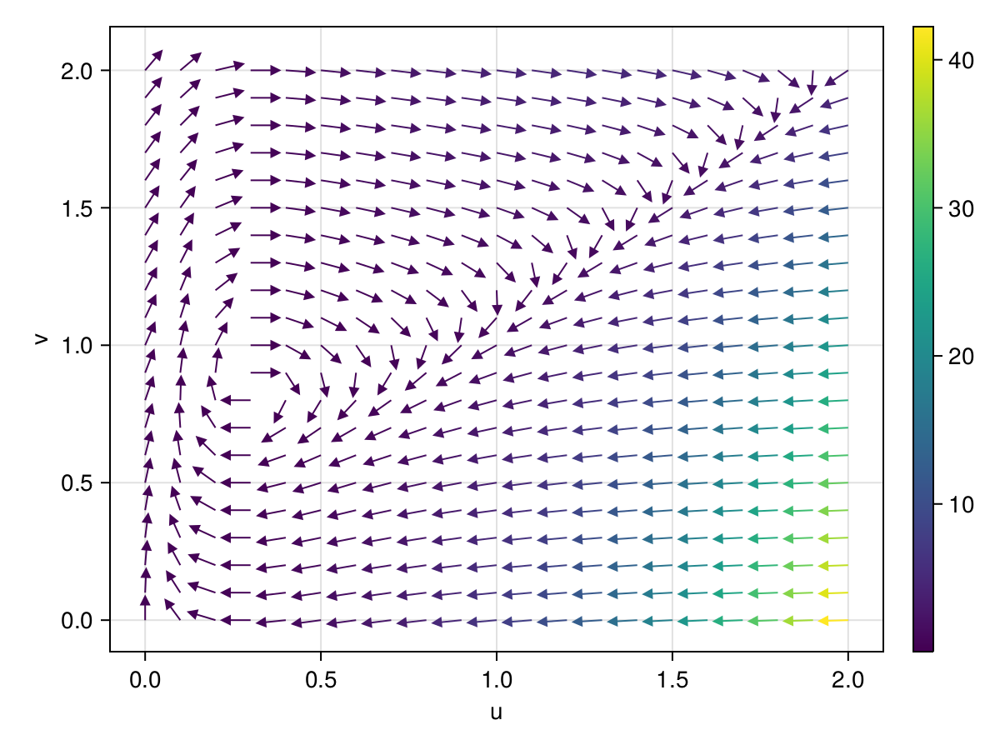

In [51]:
x = 0:0.0001:1.25
y = 0:0.0001:1.25
a = 0.02
b = 5
c = 0.3 

x = zeros((length(xs), length(ys)))
y = zeros((length(ys), length(xs)))
ẋ = zeros((length(xs), length(ys)))
ẏ = zeros((length(ys), length(xs)))

for (i, _x) ∈ enumerate(xs), (j, _y) ∈ enumerate(ys)
    x[i,j] = _x
    y[i,j] = _y
    ẋ[i,j] = b * (_y - _x) * (a + _x^2) - _x 
    ẏ[i,j] = c - _x
end

size_vec = length(xs)*length(ys)
x = reshape(x, size_vec)
y = reshape(y, size_vec)
ẋ = reshape(ẋ, size_vec)
ẏ = reshape(ẏ, size_vec)

mag = sqrt.(ẋ.^2 + ẏ.^2)
ẋ = ẋ ./ mag ./ 15
ẏ = ẏ ./ mag ./ 15

v1 = x .* (1 ./ (b .* (a .+ x .^ 2)) .+ 1) 
u1 = fill(c, length(y))

fig = Figure()
ax = Axis(fig[1,1])
arrows!(ax, x, y, ẋ, ẏ, color = mag, colormap =:viridis)
Colorbar(fig[1,2], limits = (minimum(mag), maximum(mag)))
ax.xlabel = "u"
ax.ylabel = "v"
save("656.png", fig)
fig